# Analysis of Singapore's Bus Data
## Hands-on attempt at understanding the datasets and doing some data visualisations.

In [1]:
import pandas as pd 

# To sort the obtained data set: 
First, import the origin destination trip records using pandas' `read_csv` which reads a csv file. 
<br> The `usecols` argument allows you to select the columns required for your dataframe.

In [2]:
od_three_months = pd.read_csv('Data/od_three_months.csv',\
                usecols=['ORIGIN_PT_CODE', 'DESTINATION_PT_CODE', 'TOTAL_TRIPS'])

od_three_months['ORIGIN_PT_CODE'] = od_three_months['ORIGIN_PT_CODE'].astype("str").str.zfill(5)
od_three_months['DESTINATION_PT_CODE'] = od_three_months['DESTINATION_PT_CODE'].astype("str").str.zfill(5)

Since we have three months worth of data, it is easier to analyse it when the data is combined as a whole. 
The `.groupby` method takes in an attribute, and groups the data according to the categories, then applies a function to the category. 

In [3]:
od_modified = od_three_months.groupby(['ORIGIN_PT_CODE', 'DESTINATION_PT_CODE'])['TOTAL_TRIPS'].sum()
od_stops = od_modified.reset_index()

In [4]:
od_stops.head()

,ORIGIN_PT_CODE,DESTINATION_PT_CODE,TOTAL_TRIPS
0,01012,01112,4821
1,01012,01113,3660
2,01012,01121,2306
3,01012,01211,3432
4,01012,01311,5780


Next, import the bus stop data. 

In [5]:
bus_stops = pd.read_csv('Data/bus_stops.csv')
bus_stops["BusStopCode"] = bus_stops["BusStopCode"].astype("str").str.zfill(5)
bus_stops.head(5)

,BusStopCode,RoadName,Description,Latitude,Longitude
0,01012,Victoria St,Hotel Grand Pacific,1.296848,103.852536
1,01013,Victoria St,St. Joseph's Ch,1.297710,103.853225
2,01019,Victoria St,Bras Basah Cplx,1.296990,103.853022
3,01029,Nth Bridge Rd,Opp Natl Lib,1.296673,103.854414
4,01039,Nth Bridge Rd,Bugis Cube,1.298208,103.855491


For a more comprehensive overview of where the bus stops are located, we will require the **subzone** name and **region** of each bus stop. As we will deal with geospatial data, we require the following packages: `geopandas`, `numpy`, and `matplotlib.pyplot`. 

Import the geospatial data, using geoppanda's `read_file` function, which reflects the division of land in Singapore based on URA's Master Plan 2019. 

In [6]:
import geopandas as gpd
import numpy as np 
import matplotlib.pyplot as plt

In [7]:
geo_df = gpd.read_file('Data/MP19_SZ_No_Sea/URA_MP19_SUBZONE_NO_SEA_PL.shp')

To ensure that we are evaluating the geodataframe with the correct Coordinate Reference System (CRS), we use `.to_crs(epsg value)` with the correct epsg value.

In [8]:
geo_df_reproj = geo_df.to_crs(3857)

To view the columns in the imported geodataframe, use `.columns`.

In [9]:
geo_df_reproj.columns

Index(['SUBZONE_NO', 'SUBZONE_N', 'SUBZONE_C', 'CA_IND', 'PLN_AREA_N',
       'PLN_AREA_C', 'REGION_N', 'REGION_C', 'INC_CRC', 'FMEL_UPD_D',
       'geometry'],
      dtype='object')

To merge the geodataframe with the bus stop dataset, we need to first convert the bus stop dataframe into a geodataframe.
<br> We do so by creating a representation of the geometry. We initialise a `geometry` column in the bus stop dataframe with the `Point` constructor function from the geometry module of the shapely package, `shapely.geometry`. Then, we ensure that the CRS of the bus stop geodataframe matches that of URA's Master Plan.

In [10]:
from shapely.geometry import Point
# Creating a point geometry column
bus_stops['geometry'] = bus_stops.apply(lambda x: Point((x.Longitude, x.Latitude)),
                                       axis = 1)

In [11]:
# Create a GeoDataFrame from the original bus_stops DataFrame
bus_stops_geo = gpd.GeoDataFrame(bus_stops, 
                                 crs = "epsg:4326",
                                 geometry = bus_stops.geometry)
bus_stops_geo_reproj = bus_stops_geo.to_crs(3857)

The two geodataframes can then be merged with `.sjoin`, a function of geopandas that allows us to combine the two layers we have - the bus stops across Singapore (which are points) and the geodataframe encoding the division of Singapore's land. It is important to specify the `how` argument of `.sjoin` to ensure that data is not lost. 
<br> The below `.sjoin` call results in the merger of the two files, with `bus_stops_geo_reproj` as the base file. The `geometry` column of `geo_df_reproj` is thus lost.

In [12]:
joined_gdf = gpd.sjoin(bus_stops_geo_reproj, 
                       geo_df_reproj, 
                       how = 'left')

As I will only require the BusStopCode, Subzone Name and Region Name, the geodataframe obtained, `joined_gdf`, needs to be subset by columns. 
I will also need to convert the subsequent GeoDataFrame into a DataFrame for further analysis. 

In [13]:
joined_gdf.columns

Index(['BusStopCode', 'RoadName', 'Description', 'Latitude', 'Longitude',
       'geometry', 'index_right', 'SUBZONE_NO', 'SUBZONE_N', 'SUBZONE_C',
       'CA_IND', 'PLN_AREA_N', 'PLN_AREA_C', 'REGION_N', 'REGION_C', 'INC_CRC',
       'FMEL_UPD_D'],
      dtype='object')

In [14]:
# Subset the current joined geo_df to get the columns I need.
required_bus_stops = joined_gdf[['BusStopCode', 'SUBZONE_N', 'PLN_AREA_N', 'REGION_N']]
required_bus_stops.head()
bus_stops_df = pd.DataFrame(required_bus_stops)

The purpose of merging the origin-destination trip records and the bus stop data (where the subzone, planning area, and region of each bus stop has been identified) is to allow us to better identify where the start and stop bus stops are situated at. <br> Here, we use the `.merge` function from the `pandas` package. `.merge` takes in two dataframes, and the `how` argument allows us to specify how we want to join the data. <br> The `on` argument specifies the column or index level names to join on. Specifically, `left_on` specifies the column levels from the left dataframe to use as keys. Likewise, `right_on` specifies the same information from the right dataframe to use as keys. The datasets are merged _twice_ so that we get information on both origin and destination bus stops. 

In [15]:
# To join the 2 datasets we have obtained:
od_stops = pd.merge(od_stops, bus_stops_df,\
                    how = 'left', left_on ='ORIGIN_PT_CODE', right_on = 'BusStopCode')
od_stops = pd.merge(od_stops, bus_stops_df,\
             how = 'left', left_on = 'DESTINATION_PT_CODE', right_on = 'BusStopCode')
od_stops.head(10)

,ORIGIN_PT_CODE,DESTINATION_PT_CODE,TOTAL_TRIPS,BusStopCode_x,SUBZONE_N_x,PLN_AREA_N_x,REGION_N_x,BusStopCode_y,SUBZONE_N_y,PLN_AREA_N_y,REGION_N_y
0,01012,01112,4821,01012,VICTORIA,ROCHOR,CENTRAL REGION,01112,VICTORIA,ROCHOR,CENTRAL REGION
1,01012,01113,3660,01012,VICTORIA,ROCHOR,CENTRAL REGION,01113,BUGIS,DOWNTOWN CORE,CENTRAL REGION
2,01012,01121,2306,01012,VICTORIA,ROCHOR,CENTRAL REGION,01121,ROCHOR CANAL,ROCHOR,CENTRAL REGION
3,01012,01211,3432,01012,VICTORIA,ROCHOR,CENTRAL REGION,01211,CRAWFORD,KALLANG,CENTRAL REGION
4,01012,01311,5780,01012,VICTORIA,ROCHOR,CENTRAL REGION,01311,LAVENDER,KALLANG,CENTRAL REGION
5,01012,01549,22,01012,VICTORIA,ROCHOR,CENTRAL REGION,01549,KAMPONG GLAM,ROCHOR,CENTRAL REGION
6,01012,01559,78,01012,VICTORIA,ROCHOR,CENTRAL REGION,01559,KAMPONG GLAM,ROCHOR,CENTRAL REGION
7,01012,07371,227,01012,VICTORIA,ROCHOR,CENTRAL REGION,07371,LAVENDER,KALLANG,CENTRAL REGION
8,01012,60011,321,01012,VICTORIA,ROCHOR,CENTRAL REGION,60011,KALLANG BAHRU,KALLANG,CENTRAL REGION
9,01012,60021,343,01012,VICTORIA,ROCHOR,CENTRAL REGION,60021,KALLANG BAHRU,KALLANG,CENTRAL REGION


In [16]:
# rename the df for easier use
final_df = od_stops
final_df.shape

(372020, 11)

## Filtering the dataframe
The function `filter_trips()` below allows us to easily filter the data frame we are working on, to obtain a subset of the data set.  

In [17]:
def filter_trips(od_stops,
                 level, # 'SUBZONE', 'PLN_AREA', 'REGION'
                 selected_origin, # ['VICTORIA']
                 selected_dest, # 'all' OR ['CHONG BOON', 'CHONG PANG']
                 min_trips): # 5000
    '''
    Filters the origin-destination dataframe for selected origin-destination pairs
    and for a minimum number of trips.

    Args:
        od_stops: Pandas dataframe of all origin-destination bus stops and trip numbers
        level: Which geospatial level to filter at (subzone, planning area, or region)
        selected_origin: The origin area(s) in the level selected 
        selected_dest: The destination area(s) in the level selected
        min_trips: integer value of the minimum number of trips to be filtered
    Returns:
        What do you return? Pandas dataframe which is filtered
    Raises:
        AssertionError: For incorrect inputs
    '''

    # Check that the level that was passed in is correct
    if level not in ['SUBZONE', 'PLN_AREA', 'REGION']:
        raise AssertionError("Error! Please key in a correct level.")

    # Check that there is some selection
    if len(selected_origin) == 0:
        raise AssertionError("Error! Please select at least one origin.")
    if len(selected_dest) == 0:
        raise AssertionError("Error! Please select at least one destination.")

    # Check that min_trips is at least 1
    if min_trips < 0:
        raise AssertionError("Error! Please key in a positive integer value \
                                to be the minimum number of trips.")
        
    def generate_boolean_mask(df, level, origin_dest, selected):
        if selected == 'all':
            boolean_mask = ~df[f'{level}_N_{origin_dest}'].isin([])
        else:
            boolean_mask = df[f'{level}_N_{origin_dest}'].isin(selected)
        return boolean_mask

    boolean_mask_origin = generate_boolean_mask(od_stops,
                                           level,
                                           "x",
                                           selected_origin)

    boolean_mask_dest = generate_boolean_mask(od_stops,
                                           level,
                                           "y",
                                           selected_dest)

    boolean_mask_mintrips = od_stops['TOTAL_TRIPS'] >= min_trips

    output = od_stops[boolean_mask_origin & boolean_mask_dest & boolean_mask_mintrips].reset_index(drop = True)

    return output

In [18]:
# To test written code:
filter_trips(final_df, 'SUBZONE', ['VICTORIA'], ['BUGIS'], 5)

,ORIGIN_PT_CODE,DESTINATION_PT_CODE,TOTAL_TRIPS,BusStopCode_x,SUBZONE_N_x,PLN_AREA_N_x,REGION_N_x,BusStopCode_y,SUBZONE_N_y,PLN_AREA_N_y,REGION_N_y
0,01012,01113,3660,01012,VICTORIA,ROCHOR,CENTRAL REGION,01113,BUGIS,DOWNTOWN CORE,CENTRAL REGION
1,01013,01113,617,01013,VICTORIA,ROCHOR,CENTRAL REGION,01113,BUGIS,DOWNTOWN CORE,CENTRAL REGION
2,07518,01511,440,07518,VICTORIA,ROCHOR,CENTRAL REGION,01511,BUGIS,DOWNTOWN CORE,CENTRAL REGION
3,07518,01621,411,07518,VICTORIA,ROCHOR,CENTRAL REGION,01621,BUGIS,DOWNTOWN CORE,CENTRAL REGION
4,07518,01639,1699,07518,VICTORIA,ROCHOR,CENTRAL REGION,01639,BUGIS,DOWNTOWN CORE,CENTRAL REGION
5,07569,01511,227,07569,VICTORIA,ROCHOR,CENTRAL REGION,01511,BUGIS,DOWNTOWN CORE,CENTRAL REGION
6,07569,01621,130,07569,VICTORIA,ROCHOR,CENTRAL REGION,01621,BUGIS,DOWNTOWN CORE,CENTRAL REGION
7,07569,01639,415,07569,VICTORIA,ROCHOR,CENTRAL REGION,01639,BUGIS,DOWNTOWN CORE,CENTRAL REGION


# Generating the chord diagram

In [40]:
# Shaun's function for generating the chord diagram data

pd.options.mode.chained_assignment = None

def generate_chord_diagram(final_df, level, areas):
    
    '''
    Generates the dataset that has all information required in the appropriate structure to build a chord diagram.

    Args:
        final_df: The dataframe to be filtered
        level: Which geospatial level to filter at (subzone, planning area, or region)
        areas: A list of area(s) in the level selected

    Returns:
        What do you return? Pandas dataset which has the required structure for a chord diagram visualisation.

    Raises:
        AssertionError: For incorrect inputs
    '''
    
     # Check that the level that was passed in is correct
    if level not in ['SUBZONE', 'PLN_AREA', 'REGION']:
        raise AssertionError("Error! Please key in a correct level.")

    # Check that there is some selection
    if len(areas) == 0:
        raise AssertionError("Error! Please select at least one area.")
    if len(areas) > 3:
        raise AssertionError("Error! Please select at most three areas.")
    
    
    # Filter the data for only the areas we have selected
    selected_areas_df = final_df[final_df[f'{level}_N_x'].isin(areas) & final_df[f'{level}_N_y'].isin(areas)]
    
    # Filter the data for the rest of the trips
    other_areas_df = final_df[(final_df[f'{level}_N_x'].isin(areas) & ~final_df[f'{level}_N_y'].isin(areas)) | (~final_df[f'{level}_N_x'].isin(areas) & final_df[f'{level}_N_y'].isin(areas))]
    
    # Convert the other non-selected towns into "OTHERS"
    other_areas_df[f'{level}_N_x'] = [pln_area if pln_area in areas else 'ZZOTHERS' for pln_area in other_areas_df[f'{level}_N_x']]
    other_areas_df[f'{level}_N_y'] = [pln_area if pln_area in areas else 'ZZOTHERS' for pln_area in other_areas_df[f'{level}_N_y']]
    
    # Add them all back together
    limited_areas_df = pd.concat([selected_areas_df, other_areas_df], ignore_index = True)
    
    # Group by the planning area and sum the total trips
    trips2 = limited_areas_df.groupby([f'{level}_N_x', f'{level}_N_y'])['TOTAL_TRIPS'].sum()
    links2 = pd.DataFrame.from_records(list(trips2.index), columns = ['start', 'end'])
    links2['trips'] = trips2.values
    
    links2['set'] = ''
    for i in range(len(links2)):
        links2['set'][i] = ','.join(sorted([links2['start'][i], links2['end'][i]]))
    chord_df = links2.groupby('set')['trips'].sum().reset_index()
    chord_final = pd.concat([chord_df, chord_df['set'].str.split(',', expand = True)], axis = 1)
    chord_final.drop('set', inplace = True, axis = 1)
    chord_final.columns = ['value', 'source', 'target']
    chord_final['source'] = chord_final['source'].replace({k:str(i) for i,k in enumerate(selected_towns)}).replace({'ZZOTHERS': len(selected_towns)}).astype('int32')
    chord_final['target'] = chord_final['target'].replace({k:str(i) for i,k in enumerate(selected_towns)}).replace({'ZZOTHERS': len(selected_towns)}).astype('int32')
    
    nodes = hv.Dataset(pd.DataFrame(selected_towns + ['OTHERS'], columns = ['name']), 'index')
    
    return nodes, chord_final.loc[:,['source', 'target', 'value']]

Note that this function ensures that:
* Trips are summed bidirectionally (ie it doesn't matter if it's A -> B or B -> A, we sum the traffic both ways.
* `OTHERS` will always be the last category, regardless of how many towns you pass in. The links will also never be coloured with the `OTHERS` colour.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
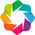

In [20]:
from holoviews import opts, dim
import holoviews as hv

hv.extension('bokeh')
hv.output(size=200)

## Generating a chord diagram with holoviews
Feel free to change the `generate_chord_diagram` function call below.
<br> Identify which level you wish to see the visualisation at - change the `levels` argument to either `'REGION'`, `'PLN_AREA'`, or `'SUBZONE'`.
<br> Input a maximum of three selected towns at the level you desire through changing the items in the list. An example is shown below. 
Run the code. 

In [44]:
selected_towns = ['BUKIT BATOK', 'CLEMENTI', 'JURONG EAST']
nodes, links = generate_chord_diagram(final_df, 'PLN_AREA', selected_towns)
chord = hv.Chord((links, nodes))
chord.opts(node_color=dim('index').str(),
           edge_color=dim('source').str(),
           labels='name', 
           cmap='Category10',
           edge_cmap='Category10')

:Chord   [source,target]   (value)

# Analysing the data
## Evaluation Points
1) Area with the greatest volume of passenger flow  -- assumed to be the town area/jurong industrial area
2) Bus stop density (within subzones)
3) To consider the relationship of the ridership + number of bus stops in the area: 
        a. population density 
        b. the type of residence in the planning area 
        c. land size 
        d. number of bus stops per km^2 
4) Relationship between the ridership and bus stop density/number of bus stops per km^2/population density/planning area level/subzone level. (Plot as points, then draw a best fit line). 


In [32]:
#1 Area with the greatest volume of passenger flow OUT (passengers BOARDING at this bus stop)
# Assessed by total trips TO destination bus stop, using final_df
greatest_trips_out_of_area = final_df.groupby('ORIGIN_PT_CODE')['TOTAL_TRIPS'].sum()
greatest_trips_out_of_area.sort_values(ascending=False)

ORIGIN_PT_CODE
22009    4378682
46009    3412648
75009    2993823
52009    2265524
59009    2264948
          ...   
32061          5
32071          4
46239          3
59599          1
22579          1
Name: TOTAL_TRIPS, Length: 5013, dtype: int64

In [33]:
bus_stop_codes = ['22009', '46009', '75009', '52009', '59009']
condition = bus_stops['BusStopCode'].isin(bus_stop_codes)
bus_stops[condition]

,BusStopCode,RoadName,Description,Latitude,Longitude,geometry
977,22009,Jurong West Ctrl 3,Boon Lay Int,1.339323,103.705457,POINT (103.70546 1.33932)
2268,46009,Woodlands Sq,Woodlands Int,1.436874,103.786162,POINT (103.78616 1.43687)
2655,52009,Lor 6 Toa Payoh,Toa Payoh Int,1.332021,103.846928,POINT (103.84693 1.33202)
3157,59009,Yishun Ave 2,Yishun Int,1.428400,103.836097,POINT (103.83610 1.42840)
4104,75009,Tampines Ctrl 1,Tampines Int,1.354076,103.943391,POINT (103.94339 1.35408)


In [34]:
#1b Area with the greatest volume of passenger flow IN (passengers ALIGHTING at this bus stop)
# Assessed by total trips TO destination bus stop, using final_df
greatest_trips_into_area = final_df.groupby('DESTINATION_PT_CODE')['TOTAL_TRIPS'].sum()
greatest_trips_into_area.sort_values(ascending=False)

DESTINATION_PT_CODE
22009    3781990
75009    2982705
46009    2607965
84009    2220621
52009    2099131
          ...   
46219          5
47711          4
46109          4
32059          4
22571          4
Name: TOTAL_TRIPS, Length: 5017, dtype: int64

In [35]:
bus_stop_codes = ['22009', '75009', '46009', '84009', '52009']
condition = bus_stops['BusStopCode'].isin(bus_stop_codes)
bus_stops[condition]

,BusStopCode,RoadName,Description,Latitude,Longitude,geometry
977,22009,Jurong West Ctrl 3,Boon Lay Int,1.339323,103.705457,POINT (103.70546 1.33932)
2268,46009,Woodlands Sq,Woodlands Int,1.436874,103.786162,POINT (103.78616 1.43687)
2655,52009,Lor 6 Toa Payoh,Toa Payoh Int,1.332021,103.846928,POINT (103.84693 1.33202)
4104,75009,Tampines Ctrl 1,Tampines Int,1.354076,103.943391,POINT (103.94339 1.35408)
4558,84009,Bedok Nth Dr,Bedok Int,1.324539,103.929038,POINT (103.92904 1.32454)


In [36]:
# This shows flow of passengers from one subzone to another subzone.
greatest_trips_within_sz = final_df.groupby(['SUBZONE_N_y', 'SUBZONE_N_x'])['TOTAL_TRIPS'].sum()
greatest_trips_within_sz.sort_values(ascending=False)

SUBZONE_N_y          SUBZONE_N_x        
TAMPINES EAST        TAMPINES EAST          3983481
BEDOK NORTH          BEDOK NORTH            2833953
WOODLANDS EAST       WOODLANDS EAST         2078423
YUNNAN               JURONG WEST CENTRAL    1680659
JURONG WEST CENTRAL  YUNNAN                 1597863
                                             ...   
SOMERSET             PORT                         1
PEOPLE'S PARK        FORT CANNING                 1
GOMBAK               JURONG GATEWAY               1
PEOPLE'S PARK        CLARKE QUAY                  1
ALEXANDRA NORTH      REDHILL                      1
Name: TOTAL_TRIPS, Length: 24535, dtype: int64

## Bus Stop Densities by Subzones
#1 Counting the number of bus stops per subzone with the `.groupby()` and `.count()` functions.

In [37]:
req_cols = ['BusStopCode', 'SUBZONE_N']
bs_sz = bus_stops_df[req_cols].groupby('SUBZONE_N').count()
bs_sz_count = bs_sz.rename(columns = {"BusStopCode" : "count"})

### Trivia questions
#1a. Subzone with the greatest number of bus stops.

In [38]:
bs_sz_sorted = bs_sz_count.sort_values(by='count', ascending=False)
## Subzone MURAI has the most number of bus stops within itself -- 87. 
print(bs_sz_sorted.head(5))

               count
SUBZONE_N           
MURAI             87
TAMPINES EAST     83
FRANKEL           80
TUAS NORTH        57
TAMPINES WEST     55


#1b. Subzones with the least number of bus stops

In [39]:
sz_1_bus_stop = bs_sz_count[bs_sz_count["count"] == 1]
print(sz_1_bus_stop.index)

Index(['BAHAR', 'FOREST HILL', 'ISTANA NEGARA', 'LITTLE INDIA', 'MACKENZIE',
       'MAXWELL', 'MONK'S HILL', 'ORANGE GROVE', 'OXLEY', 'PHILLIP'],
      dtype='object', name='SUBZONE_N')


In [40]:
bs_sz_count.reset_index()

,SUBZONE_N,count
0,ADMIRALTY,21
1,AIRPORT ROAD,3
2,ALEXANDRA HILL,24
3,ALEXANDRA NORTH,4
4,ALJUNIED,45
...,...,...
307,YISHUN SOUTH,26
308,YISHUN WEST,34
309,YUHUA EAST,17
310,YUHUA WEST,12


#2 To obtain the land areas per planning area/subzone, we need to do some data manipulation with `geopandas`.

In [41]:
geo_df_copy = geo_df.copy()
geo_df_copy['area'] = geo_df_copy['geometry'].area / 10**6
geo_df_copy.head(2)

,SUBZONE_NO,SUBZONE_N,SUBZONE_C,CA_IND,PLN_AREA_N,PLN_AREA_C,REGION_N,REGION_C,INC_CRC,FMEL_UPD_D,geometry,area
0,1,MARINA EAST,MESZ01,Y,MARINA EAST,ME,CENTRAL REGION,CR,4FB7E5B1B9455DE0,2019-12-23,"POLYGON ((33222.981 29588.127, 33222.515 29587...",1.844042
1,5,INSTITUTION HILL,RVSZ05,Y,RIVER VALLEY,RV,CENTRAL REGION,CR,C3C22D1EE31757BD,2019-12-23,"POLYGON ((28481.446 30886.220, 28483.405 30886...",0.392563


In [42]:
pln_area_land = geo_df_copy.groupby(['PLN_AREA_N', 'PLN_AREA_C'])['area'].sum().reset_index()
pln_area_land

,PLN_AREA_N,PLN_AREA_C,area
0,ANG MO KIO,AM,13.942584
1,BEDOK,BD,21.733967
2,BISHAN,BS,7.608113
3,BOON LAY,BL,8.282808
4,BUKIT BATOK,BK,11.140156
5,BUKIT MERAH,BM,14.461195
6,BUKIT PANJANG,BP,9.019940
7,BUKIT TIMAH,BT,17.514946
8,CENTRAL WATER CATCHMENT,CC,37.158689
9,CHANGI,CH,41.471100


In [43]:
region_area_land = geo_df_copy.groupby('REGION_N')['area'].sum().reset_index()
region_area_land

,REGION_N,area
0,CENTRAL REGION,136.393582
1,EAST REGION,113.461576
2,NORTH REGION,139.416922
3,NORTH-EAST REGION,136.052884
4,WEST REGION,259.459050


In [44]:
sz_land = geo_df_copy[['SUBZONE_N', 'area', 'geometry']]
sz_land

,SUBZONE_N,area,geometry
0,MARINA EAST,1.844042,"POLYGON ((33222.981 29588.127, 33222.515 29587..."
1,INSTITUTION HILL,0.392563,"POLYGON ((28481.446 30886.220, 28483.405 30886..."
2,ROBERTSON QUAY,0.506589,"POLYGON ((28087.344 30540.999, 28087.540 30540..."
3,JURONG ISLAND AND BUKOM,36.639387,"MULTIPOLYGON (((14557.697 30447.212, 14562.889..."
4,FORT CANNING,0.388733,"POLYGON ((29542.526 31041.199, 29553.718 31034..."
...,...,...,...
327,UPPER THOMSON,3.849507,"POLYGON ((29036.498 38365.086, 29015.440 38293..."
328,SHANGRI-LA,0.687914,"POLYGON ((28228.195 39216.137, 28271.551 39216..."
329,TOWNSVILLE,0.546394,"POLYGON ((29649.875 38978.996, 29671.324 38978..."
330,MARYMOUNT,1.964145,"POLYGON ((29469.703 36372.102, 29466.131 36348..."


In [45]:
sz_land_df = pd.DataFrame(sz_land)

In [46]:
# Checking for missing values
sz_land_df.isna().any()

SUBZONE_N    False
area         False
geometry     False
dtype: bool

In [47]:
bus_density_sz1 = sz_land_df.merge(bs_sz_count, how = 'left', on = 'SUBZONE_N')

In [48]:
bd_sz1 = bus_density_sz1.fillna(value=0)

In [49]:
bd_sz1.head()

,SUBZONE_N,area,geometry,count
0,MARINA EAST,1.844042,"POLYGON ((33222.981 29588.127, 33222.515 29587...",0.0
1,INSTITUTION HILL,0.392563,"POLYGON ((28481.446 30886.220, 28483.405 30886...",2.0
2,ROBERTSON QUAY,0.506589,"POLYGON ((28087.344 30540.999, 28087.540 30540...",10.0
3,JURONG ISLAND AND BUKOM,36.639387,"MULTIPOLYGON (((14557.697 30447.212, 14562.889...",0.0
4,FORT CANNING,0.388733,"POLYGON ((29542.526 31041.199, 29553.718 31034...",6.0


In [50]:
bd_sz1['bus_stop_density'] = bd_sz1['count'] / bd_sz1['area']

In [51]:
bd_sz_gdf = gpd.GeoDataFrame(bd_sz1, geometry = bd_sz1['geometry'])
bd_sz_gdf

,SUBZONE_N,area,geometry,count,bus_stop_density
0,MARINA EAST,1.844042,"POLYGON ((33222.981 29588.127, 33222.515 29587...",0.0,0.000000
1,INSTITUTION HILL,0.392563,"POLYGON ((28481.446 30886.220, 28483.405 30886...",2.0,5.094719
2,ROBERTSON QUAY,0.506589,"POLYGON ((28087.344 30540.999, 28087.540 30540...",10.0,19.739870
3,JURONG ISLAND AND BUKOM,36.639387,"MULTIPOLYGON (((14557.697 30447.212, 14562.889...",0.0,0.000000
4,FORT CANNING,0.388733,"POLYGON ((29542.526 31041.199, 29553.718 31034...",6.0,15.434751
...,...,...,...,...,...
327,UPPER THOMSON,3.849507,"POLYGON ((29036.498 38365.086, 29015.440 38293...",47.0,12.209356
328,SHANGRI-LA,0.687914,"POLYGON ((28228.195 39216.137, 28271.551 39216...",12.0,17.444049
329,TOWNSVILLE,0.546394,"POLYGON ((29649.875 38978.996, 29671.324 38978...",9.0,16.471636
330,MARYMOUNT,1.964145,"POLYGON ((29469.703 36372.102, 29466.131 36348...",25.0,12.728187


In [52]:
bd_sz_gdf.crs = 'EPSG:3414'

## Plotting the bus stop densities per subzones as a choropleth chart
Use of `folium` package.

In [53]:
import folium

In [54]:
# Orchard Road Center Point
center_point = bd_sz_gdf.loc[0, 'geometry'].centroid
orchard_center = [center_point.y, center_point.x]

In [55]:
m = folium.Map(location = orchard_center, zoom_start = 12)

In [60]:
folium.Choropleth(geo_data = bd_sz_gdf,
             name = 'geometry',
             data = bd_sz_gdf, 
             columns = ['SUBZONE_N', 'bus_stop_density'],
             # key_on = 'feature.id',
             fill_color = 'YlGn',
             fill_opacity = 0.5,
             line_color = 'black', 
             line_opacity = 1,
             legend_name = 'Bus Stop Densities across Subzones in Singapore'
            ).add_to(m)

In [61]:
display(m)

## Population Density of each Subzone
This dataset is obtained from the data.gov.sg site, and covers the population from 2011 to 2020.

In [62]:
res_by_pa = pd.read_csv('Data/respopagesexfa2011to2020/respopagesexfa2011to2020.csv')

In [63]:
cond = res_by_pa['Time'] == 2020
pop_density_2020 = res_by_pa[cond]

pop_density_2020

,PA,SZ,AG,Sex,FA,Pop,Time
662796,Ang Mo Kio,Ang Mo Kio Town Centre,0_to_4,Males,<= 60,0,2020
662797,Ang Mo Kio,Ang Mo Kio Town Centre,0_to_4,Males,>60 to 80,10,2020
662798,Ang Mo Kio,Ang Mo Kio Town Centre,0_to_4,Males,>80 to 100,20,2020
662799,Ang Mo Kio,Ang Mo Kio Town Centre,0_to_4,Males,>100 to 120,50,2020
662800,Ang Mo Kio,Ang Mo Kio Town Centre,0_to_4,Males,>120,20,2020
...,...,...,...,...,...,...,...
738487,Yishun,Yishun West,90_and_over,Females,>60 to 80,40,2020
738488,Yishun,Yishun West,90_and_over,Females,>80 to 100,50,2020
738489,Yishun,Yishun West,90_and_over,Females,>100 to 120,20,2020
738490,Yishun,Yishun West,90_and_over,Females,>120,20,2020


In [64]:
total_pop_per_sz_2020 = pop_density_2020.groupby(['PA', 'SZ', 'Time']).sum().reset_index(drop = False)

In [65]:
total_pop_per_sz_2020['SZ'] = total_pop_per_sz_2020['SZ'].str.upper()

In [66]:
total_pop_per_sz_2020

,PA,SZ,Time,Pop
0,Ang Mo Kio,ANG MO KIO TOWN CENTRE,2020,4850
1,Ang Mo Kio,CHENG SAN,2020,28120
2,Ang Mo Kio,CHONG BOON,2020,26570
3,Ang Mo Kio,KEBUN BAHRU,2020,22620
4,Ang Mo Kio,SEMBAWANG HILLS,2020,6790
...,...,...,...,...
327,Yishun,SPRINGLEAF,2020,4280
328,Yishun,YISHUN CENTRAL,2020,2660
329,Yishun,YISHUN EAST,2020,60740
330,Yishun,YISHUN SOUTH,2020,42410


In [67]:
sz_area_land = geo_df_copy.groupby('SUBZONE_N')['area'].sum().reset_index()

In [68]:
pop_density_sz = pd.merge(total_pop_per_sz_2020,
                          sz_area_land, 
                          left_on = "SZ", 
                          right_on = "SUBZONE_N", 
                          how = "left")

In [69]:
pop_density_sz.astype({'Pop' : 'float64'}).dtypes

PA            object
SZ            object
Time           int64
Pop          float64
SUBZONE_N     object
area         float64
dtype: object

In [70]:
# Note that Pop refers to resident count in the subzone/pln area.
pop_density_sz['Pop Density'] = pop_density_sz['Pop'] / pop_density_sz['area']

## Bus Stop density vs Population density
With our two data structures `pop_density_sz` and `bd_sz1`, we are now able to construct a plot to show the relationship between the bus stop densities and population densities.

In [71]:
bd_sz1

,SUBZONE_N,area,geometry,count,bus_stop_density
0,MARINA EAST,1.844042,"POLYGON ((33222.981 29588.127, 33222.515 29587...",0.0,0.000000
1,INSTITUTION HILL,0.392563,"POLYGON ((28481.446 30886.220, 28483.405 30886...",2.0,5.094719
2,ROBERTSON QUAY,0.506589,"POLYGON ((28087.344 30540.999, 28087.540 30540...",10.0,19.739870
3,JURONG ISLAND AND BUKOM,36.639387,"MULTIPOLYGON (((14557.697 30447.212, 14562.889...",0.0,0.000000
4,FORT CANNING,0.388733,"POLYGON ((29542.526 31041.199, 29553.718 31034...",6.0,15.434751
...,...,...,...,...,...
327,UPPER THOMSON,3.849507,"POLYGON ((29036.498 38365.086, 29015.440 38293...",47.0,12.209356
328,SHANGRI-LA,0.687914,"POLYGON ((28228.195 39216.137, 28271.551 39216...",12.0,17.444049
329,TOWNSVILLE,0.546394,"POLYGON ((29649.875 38978.996, 29671.324 38978...",9.0,16.471636
330,MARYMOUNT,1.964145,"POLYGON ((29469.703 36372.102, 29466.131 36348...",25.0,12.728187


In [72]:
pop_density_sz

,PA,SZ,Time,Pop,SUBZONE_N,area,Pop Density
0,Ang Mo Kio,ANG MO KIO TOWN CENTRE,2020,4850,ANG MO KIO TOWN CENTRE,0.316882,15305.380984
1,Ang Mo Kio,CHENG SAN,2020,28120,CHENG SAN,0.955710,29423.145565
2,Ang Mo Kio,CHONG BOON,2020,26570,CHONG BOON,1.078622,24633.274694
3,Ang Mo Kio,KEBUN BAHRU,2020,22620,KEBUN BAHRU,1.046417,21616.621289
4,Ang Mo Kio,SEMBAWANG HILLS,2020,6790,SEMBAWANG HILLS,0.894516,7590.696944
...,...,...,...,...,...,...,...
327,Yishun,SPRINGLEAF,2020,4280,SPRINGLEAF,2.209211,1937.343500
328,Yishun,YISHUN CENTRAL,2020,2660,YISHUN CENTRAL,0.436369,6095.764918
329,Yishun,YISHUN EAST,2020,60740,YISHUN EAST,1.769246,34331.007737
330,Yishun,YISHUN SOUTH,2020,42410,YISHUN SOUTH,1.340168,31645.286537


In [73]:
# Data Preparation
pop_density = pop_density_sz["Pop Density"]
sz = pop_density_sz["SUBZONE_N"]
bs_density = bd_sz1["bus_stop_density"]
bs_sz = bd_sz1["SUBZONE_N"]

# By Planning Area
pop_density_sz.groupby("PA"). sum

<bound method GroupBy.sum of <pandas.core.groupby.generic.DataFrameGroupBy object at 0x7fa6e5d62370>>

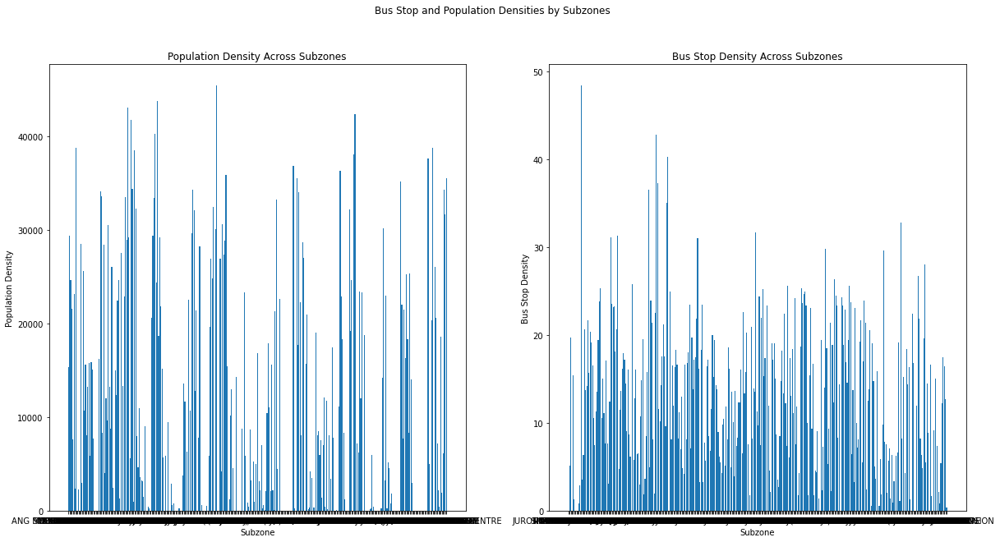

In [74]:
# Create a fig
fig = plt.figure(figsize=(20,10))

# Set Rows and Columns
rows = 1
cols = 2

# Overall Title
fig.suptitle('Bus Stop and Population Densities by Subzones') 

# LHS Plot
ax1 = fig.add_subplot(rows, cols, 1) # Call which subplot you want your graph to be on 
ax1.bar(sz, pop_density) # Plot
ax1.title.set_text('Population Density Across Subzones') # Set Title
ax1.set(xlabel="Subzone",ylabel="Population Density") # Set Labels

# RHS Plot
ax2 = fig.add_subplot(rows, cols, 2)
ax2.bar(bs_sz, bs_density)
ax2.title.set_text('Bus Stop Density Across Subzones') # Set Title
ax2.set(xlabel="Subzone",ylabel="Bus Stop Density") # Set Labels

# Show Plot
plt.show()

#3 Relationship between the ridership and bus stop density/number of bus stops per km^2/population density/planning area level/subzone level. (Plot as points, then draw a best fit line). 

In [75]:
df = od_stops.copy()

In [76]:
summed_trips_sz_in_within = df.groupby(['SUBZONE_N_y'])['TOTAL_TRIPS'].sum().reset_index(drop=False)
summed_trips_sz_in_within

,SUBZONE_N_y,TOTAL_TRIPS
0,ADMIRALTY,517109
1,AIRPORT ROAD,61115
2,ALEXANDRA HILL,1322484
3,ALEXANDRA NORTH,88415
4,ALJUNIED,3746015
...,...,...
305,YISHUN SOUTH,1521584
306,YISHUN WEST,3143244
307,YUHUA EAST,1132770
308,YUHUA WEST,1242991


In [77]:
new_df = bd_sz1.merge(summed_trips_sz_in_within, 
                      how = 'left', 
                      left_on = 'SUBZONE_N', 
                      right_on = 'SUBZONE_N_y')

In [78]:
new_df.fillna(value=0)

,SUBZONE_N,area,geometry,count,bus_stop_density,SUBZONE_N_y,TOTAL_TRIPS
0,MARINA EAST,1.844042,"POLYGON ((33222.981 29588.127, 33222.515 29587...",0.0,0.000000,0,0.0
1,INSTITUTION HILL,0.392563,"POLYGON ((28481.446 30886.220, 28483.405 30886...",2.0,5.094719,INSTITUTION HILL,93786.0
2,ROBERTSON QUAY,0.506589,"POLYGON ((28087.344 30540.999, 28087.540 30540...",10.0,19.739870,ROBERTSON QUAY,416019.0
3,JURONG ISLAND AND BUKOM,36.639387,"MULTIPOLYGON (((14557.697 30447.212, 14562.889...",0.0,0.000000,0,0.0
4,FORT CANNING,0.388733,"POLYGON ((29542.526 31041.199, 29553.718 31034...",6.0,15.434751,FORT CANNING,167691.0
...,...,...,...,...,...,...,...
327,UPPER THOMSON,3.849507,"POLYGON ((29036.498 38365.086, 29015.440 38293...",47.0,12.209356,UPPER THOMSON,1897178.0
328,SHANGRI-LA,0.687914,"POLYGON ((28228.195 39216.137, 28271.551 39216...",12.0,17.444049,SHANGRI-LA,949351.0
329,TOWNSVILLE,0.546394,"POLYGON ((29649.875 38978.996, 29671.324 38978...",9.0,16.471636,TOWNSVILLE,790194.0
330,MARYMOUNT,1.964145,"POLYGON ((29469.703 36372.102, 29466.131 36348...",25.0,12.728187,MARYMOUNT,1331155.0


No handles with labels found to put in legend.


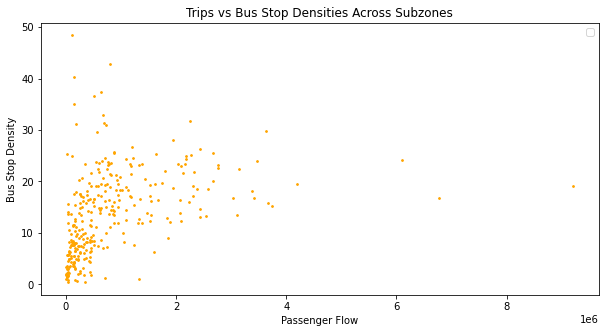

In [79]:
# Adjust figure size
plt.figure(figsize = (10,5))

# Plot Total Trips vs Bus Stop Density
plt.scatter(new_df["TOTAL_TRIPS"], 
            new_df["bus_stop_density"],
            s=3, # Size of marker
            c='orange' # Color of marker
           )

# Adding a Title
plt.title("Trips vs Bus Stop Densities Across Subzones")

# Adding a X-Label
plt.xlabel("Passenger Flow")

# Adding a Y-Label
plt.ylabel("Bus Stop Density")

# Adding a legend 
plt.legend()

# Show plot
plt.show()

In [80]:
# Plot
df.boxplot(column="TOTAL_TRIPS", by="SUBZONE_N", figsize=(10,6))

# Title
plt.title("Boxplots of total trips grouped by subzone")

# X-Label
plt.xlabel("Subzone")

# Y-Label
plt.ylabel("Total Trips")

# Rotate X Ticks
plt.xticks(rotation=90)

# Show Plot
plt.show()

KeyError: 'SUBZONE_N'

In [81]:
summed_trips_sz_out_within = final_df.groupby(['SUBZONE_N_x'])['TOTAL_TRIPS'].sum().reset_index(drop=False)

In [82]:
bd_sz1

,SUBZONE_N,area,geometry,count,bus_stop_density
0,MARINA EAST,1.844042,"POLYGON ((33222.981 29588.127, 33222.515 29587...",0.0,0.000000
1,INSTITUTION HILL,0.392563,"POLYGON ((28481.446 30886.220, 28483.405 30886...",2.0,5.094719
2,ROBERTSON QUAY,0.506589,"POLYGON ((28087.344 30540.999, 28087.540 30540...",10.0,19.739870
3,JURONG ISLAND AND BUKOM,36.639387,"MULTIPOLYGON (((14557.697 30447.212, 14562.889...",0.0,0.000000
4,FORT CANNING,0.388733,"POLYGON ((29542.526 31041.199, 29553.718 31034...",6.0,15.434751
...,...,...,...,...,...
327,UPPER THOMSON,3.849507,"POLYGON ((29036.498 38365.086, 29015.440 38293...",47.0,12.209356
328,SHANGRI-LA,0.687914,"POLYGON ((28228.195 39216.137, 28271.551 39216...",12.0,17.444049
329,TOWNSVILLE,0.546394,"POLYGON ((29649.875 38978.996, 29671.324 38978...",9.0,16.471636
330,MARYMOUNT,1.964145,"POLYGON ((29469.703 36372.102, 29466.131 36348...",25.0,12.728187


In [83]:
density_vs_flow_in_within = pd.merge(summed_trips_sz_in_within, 
                                     bd_sz1,
                                     left_on = "SUBZONE_N_x",
                                     right_on = "SUBZONE_N",
                                     how = "left")
density_vs_flow_in_within

KeyError: 'SUBZONE_N_x'

## Do it yourself! function
Select an area to compute the number of bus stops within that area selected.

In [84]:
def bus_stops_within_area(level, area):
    # where level = subzone/planning area/region 
    # and area = the subzone/planning area/region itself
    updated_df = bus_stops_df[[f'{level}_N', 'BusStopCode']]
    product = updated_df[updated_df[f'{level}_N'] == area]
    # print(product)
    return len(product.index)

In [85]:
bus_stops_within_area('PLN_AREA', 'ROCHOR')

30